### Steps in Data Exploration and Preprocessing:
1. Identification of variables and data types
2. Analyzing the basic metrics
3. Non-Graphical Univariate Analysis
4. Graphical Univariate Analysis
5. Bivariate Analysis
6. Variable transformations
7. Missing value treatment
8. Outlier treatment
9. Correlation Analysis
10. Dimensionality Reduction

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [43]:
crypto=pd.read_csv("cryptocurriencies_clean.csv")

In [44]:
crypto

,Date,Date_Year,Rank,Symbol,Market Cap,Price,Circulating Supply,Volume,%1h,price_hr_1,%24h,price_hr_24,%7d
0,2013-12-29,2013,1,BTC,9.082103e+09,745.05,1.218992e+07,1.901134e+07,-0.10,744.304950,1.96,759.652980,17.84
1,2013-12-29,2013,2,LTC,5.868998e+08,24.07,2.438799e+07,1.138424e+07,-0.94,23.843742,6.35,25.598445,39.97
2,2013-12-29,2013,3,XRP,2.127839e+08,0.03,7.817890e+09,5.677200e+04,-0.27,0.029919,-0.33,0.029901,22.27
3,2013-12-29,2013,4,OMNI,1.117532e+08,180.40,6.194780e+05,2.567540e+05,-0.05,180.309800,6.45,192.035800,0.00
4,2013-12-29,2013,5,PPC,8.989141e+07,4.28,2.098287e+07,5.403640e+05,-0.30,4.267160,1.12,4.327936,37.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7795,2021-06-13,2021,16,MATIC,9.246400e+09,1.47,6.293422e+09,1.566746e+09,1.82,1.496754,9.54,1.610238,-7.21
7796,2021-06-13,2021,17,THETA,8.776030e+09,8.78,1.000000e+09,3.143272e+08,0.66,8.837948,12.14,9.845892,-0.86
7797,2021-06-13,2021,18,ICP,8.328361e+09,64.57,1.289858e+08,3.065977e+08,0.87,65.131759,5.49,68.114893,-38.27
7798,2021-06-13,2021,19,XLM,7.975829e+09,0.34,2.313644e+10,7.838300e+08,-0.27,0.339082,5.01,0.357034,-9.58


# 1. Identification of variables and data types

### a. Categorical Variables
    1. Rank
    2. Symbol
    3. Date_Years

### b. Nominal Variables
    1. Price
    2. Circulating Supply
    3. Volume
    4. %1h
    5. %24h
    6. %7d
    7. price_hr_1
    8. price_hr_24
 

In [4]:
crypto.dtypes

Date                   object
Date_Year               int64
Rank                    int64
Symbol                 object
Market Cap            float64
Price                 float64
Circulating Supply    float64
Volume                float64
%1h                   float64
price_hr_1            float64
%24h                  float64
price_hr_24           float64
%7d                   float64
dtype: object

### Converting to category

In [5]:
crypto["Date_Year"]=crypto["Date_Year"].astype("category")

In [6]:
crypto["Rank"]=crypto["Rank"].astype("category")

In [7]:
crypto["Symbol"]=crypto["Symbol"].astype("category")

In [8]:
crypto.dtypes

Date                    object
Date_Year             category
Rank                  category
Symbol                category
Market Cap             float64
Price                  float64
Circulating Supply     float64
Volume                 float64
%1h                    float64
price_hr_1             float64
%24h                   float64
price_hr_24            float64
%7d                    float64
dtype: object

# 2. Analyzing the basic metrics

In [9]:
crypto.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7800 entries, 0 to 7799
Data columns (total 13 columns):
Date                  7800 non-null object
Date_Year             7800 non-null category
Rank                  7800 non-null category
Symbol                7800 non-null category
Market Cap            7800 non-null float64
Price                 7800 non-null float64
Circulating Supply    7800 non-null float64
Volume                7800 non-null float64
%1h                   7800 non-null float64
price_hr_1            7800 non-null float64
%24h                  7800 non-null float64
price_hr_24           7800 non-null float64
%7d                   7800 non-null float64
dtypes: category(3), float64(9), object(1)
memory usage: 647.4+ KB


In [10]:
crypto.describe()

,Market Cap,Price,Circulating Supply,Volume,%1h,price_hr_1,%24h,price_hr_24,%7d
count,7.800000e+03,7800.000000,7.800000e+03,7.800000e+03,7800.000000,7800.000000,7800.000000,7800.000000,7800.000000
mean,1.042583e+10,549.189040,1.156416e+10,1.909993e+09,0.059967,549.456944,0.384091,548.352291,7.914497
std,5.692701e+10,3890.100478,3.467399e+10,8.945975e+09,2.008020,3892.636405,10.030529,3879.102400,153.218117
min,1.391561e+06,0.000000,1.108730e+05,5.150000e+02,-28.270000,0.000000,-60.770000,0.000000,-93.910000
25%,1.804179e+07,0.130000,1.742750e+07,1.129602e+05,-0.430000,0.129532,-2.610000,0.126913,-7.722500
50%,7.934744e+08,1.520000,1.037205e+08,1.896284e+07,0.010000,1.518971,-0.100000,1.485090,0.000000
75%,3.399541e+09,22.072500,2.779530e+09,3.841098e+08,0.430000,22.142703,2.360000,22.134228,8.922500
max,1.124636e+12,60204.960000,9.899804e+11,2.264685e+11,60.700000,60244.932050,513.530000,60620.374224,9000.000000


# 3. Non-Graphical Univariate Analysis

In [11]:
crypto.head(20)

,Date,Date_Year,Rank,Symbol,Market Cap,Price,Circulating Supply,Volume,%1h,price_hr_1,%24h,price_hr_24,%7d
0,2013-12-29,2013,1,BTC,9.082103e+09,745.05,1.218992e+07,19011344.0,-0.10,744.304950,1.96,759.652980,17.84
1,2013-12-29,2013,2,LTC,5.868998e+08,24.07,2.438799e+07,11384235.0,-0.94,23.843742,6.35,25.598445,39.97
2,2013-12-29,2013,3,XRP,2.127839e+08,0.03,7.817890e+09,56772.0,-0.27,0.029919,-0.33,0.029901,22.27
3,2013-12-29,2013,4,OMNI,1.117532e+08,180.40,6.194780e+05,256754.0,-0.05,180.309800,6.45,192.035800,0.00
4,2013-12-29,2013,5,PPC,8.989141e+07,4.28,2.098287e+07,540364.0,-0.30,4.267160,1.12,4.327936,37.05
5,2013-12-29,2013,6,NXT,5.612302e+07,0.06,9.999980e+08,501304.0,0.16,0.060096,-4.00,0.057600,59.90
6,2013-12-29,2013,7,NMC,3.815179e+07,5.01,7.620093e+06,608205.0,0.23,5.021523,3.74,5.197374,22.58
7,2013-12-29,2013,8,QRK,2.740677e+07,0.11,2.468968e+08,107894.0,-0.71,0.109219,4.15,0.114565,27.17
8,2013-12-29,2013,9,PTS,2.531760e+07,20.76,1.219272e+06,38474.0,5.31,21.862356,0.00,20.760000,62.16
9,2013-12-29,2013,10,WDC,1.954685e+07,0.52,3.766455e+07,123417.0,4.28,0.542256,6.21,0.552292,30.83


In [12]:
crypto.tail(20)

,Date,Date_Year,Rank,Symbol,Market Cap,Price,Circulating Supply,Volume,%1h,price_hr_1,%24h,price_hr_24,%7d
7780,2021-06-13,2021,1,BTC,7.324657e+11,39097.86,1.873416e+07,4.066911e+10,0.61,39336.356946,9.97,42995.916642,9.02
7781,2021-06-13,2021,2,ETH,2.916739e+11,2508.39,1.162792e+08,2.709295e+10,-0.43,2497.603923,5.73,2652.120747,-7.61
7782,2021-06-13,2021,3,USDT,6.257498e+10,1.00,6.259170e+10,6.285584e+10,-0.01,0.999900,-0.14,0.998600,-0.11
7783,2021-06-13,2021,4,BNB,5.625601e+10,366.65,1.534329e+08,2.171880e+09,0.47,368.373255,6.66,391.068890,-6.90
7784,2021-06-13,2021,5,ADA,4.978386e+10,1.56,3.194634e+10,2.785909e+09,-0.02,1.559688,5.28,1.642368,-7.14
7785,2021-06-13,2021,6,DOGE,4.217219e+10,0.32,1.300079e+11,1.484851e+09,0.44,0.321408,3.94,0.332608,-12.76
7786,2021-06-13,2021,7,XRP,4.079281e+10,0.88,4.618957e+10,3.059837e+09,-0.02,0.879824,6.06,0.933328,-6.57
7787,2021-06-13,2021,8,USDC,2.364114e+10,1.00,2.364989e+10,1.731377e+09,-0.01,0.999900,-0.15,0.998500,-0.09
7788,2021-06-13,2021,9,DOT,2.101624e+10,22.08,9.519806e+08,1.233103e+09,0.12,22.106496,6.25,23.460000,-8.78
7789,2021-06-13,2021,10,UNI,1.338622e+10,23.27,5.751497e+08,4.081719e+08,-0.24,23.214152,9.15,25.399205,-10.18


In [13]:
crypto["Date_Year"].unique()

[2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
Categories (9, int64): [2013, 2014, 2015, 2016, ..., 2018, 2019, 2020, 2021]

In [14]:
crypto["Rank"].unique()

[1, 2, 3, 4, 5, ..., 16, 17, 18, 19, 20]
Length: 20
Categories (20, int64): [1, 2, 3, 4, ..., 17, 18, 19, 20]

In [15]:
crypto["Symbol"].unique()

[BTC, LTC, XRP, OMNI, PPC, ..., KLAY, BTT, ICP, MATIC, BUSD]
Length: 162
Categories (162, object): [BTC, LTC, XRP, OMNI, ..., BTT, ICP, MATIC, BUSD]

### Observations:
    1. head(20) has 20 entries from 2013
    2. taild(20) has 20 entires from 2021
    3. There are 20 ranks
    4. There is 9 years of data from 2013 to 2021
    5. There are 162 crypto coins

# 4.Graphical Univariate Analysis

#### 1. Numerical Analysis

Text(0.5, 0, 'Index')

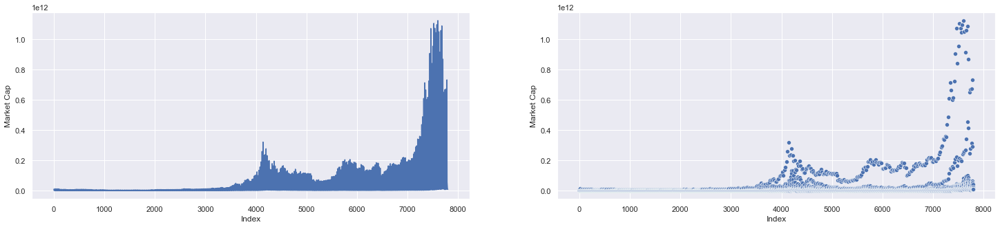

In [33]:
fig, axes = plt.subplots(1, 2, sharex=True, figsize=(25,5))
a=sns.lineplot(x=crypto.index,y=crypto["Market Cap"],ax=axes[0])
a.set_xlabel("Index")
a=sns.scatterplot(x=crypto.index,y=crypto["Market Cap"],ax=axes[1])
a.set_xlabel("Index")

In [17]:
px.histogram(crypto["Market Cap"])

Text(0.5, 0, 'Index')

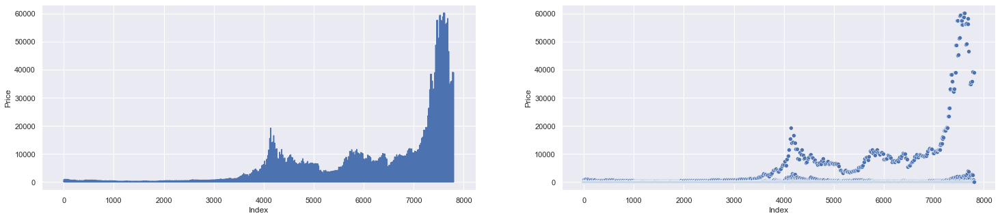

In [32]:
fig,axis=plt.subplots(1,2,sharex=True,figsize=(25,5))
a=sns.lineplot(x=crypto.index,y=crypto["Price"],ax=axis[0])
a.set_xlabel("Index")
a=sns.scatterplot(x=crypto.index,y=crypto["Price"],ax=axis[1])
a.set_xlabel("Index")

In [41]:
px.box(crypto,"Price")

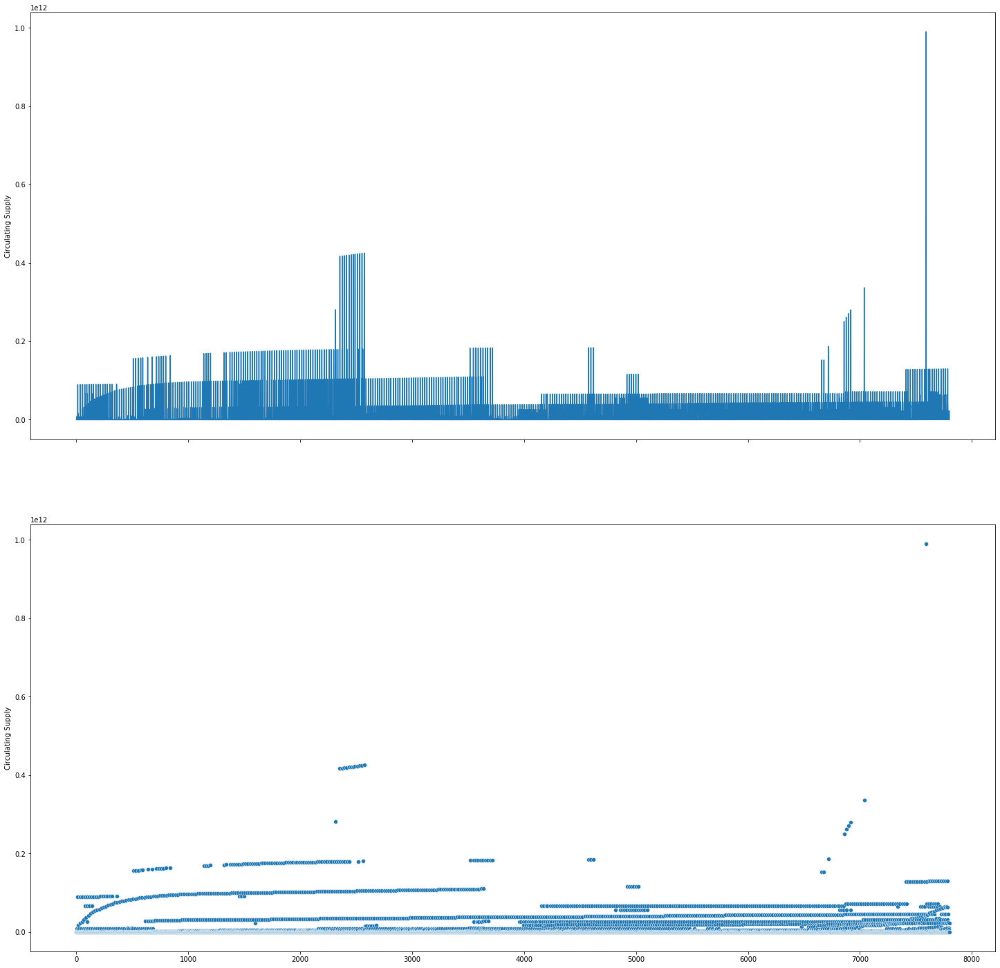

In [20]:
fig,axis=plt.subplots(2,1,sharex=True,figsize=(25,25))
sns.lineplot(x=crypto.index,y=crypto["Circulating Supply"],ax=axis[0])
sns.scatterplot(x=crypto.index,y=crypto["Circulating Supply"],ax=axis[1])

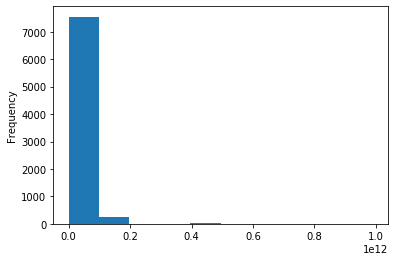

In [21]:
crypto["Circulating Supply"].plot.hist()

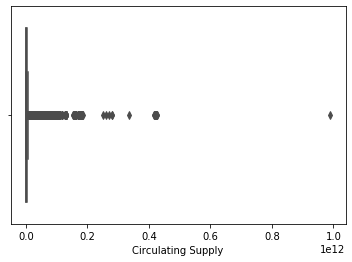

In [13]:
sns.boxplot(x=crypto["Circulating Supply"],color="blue")

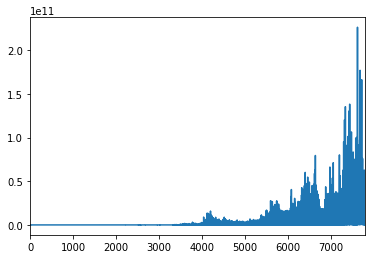

In [6]:
crypto["Volume"].plot.line()

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



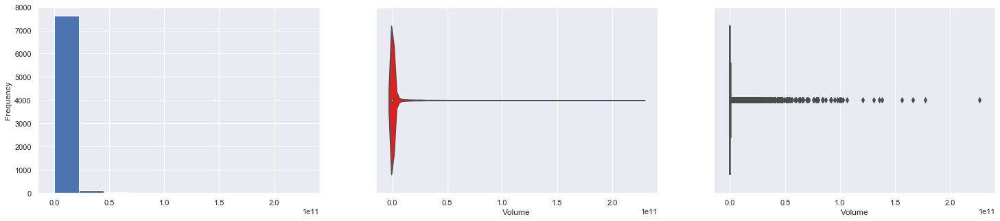

In [45]:
fig,axis=plt.subplots(1,3,sharex=True,figsize=(25,5))
crypto["Volume"].plot.hist(ax=axis[0])
sns.violinplot(crypto["Volume"],color="red",ax=axis[1])
sns.boxplot(crypto["Volume"],color="yellow",ax=axis[2])

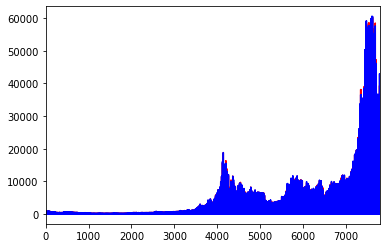

In [28]:
crypto["price_hr_1"].plot.line(color="red")
crypto["price_hr_24"].plot.line(color="blue")

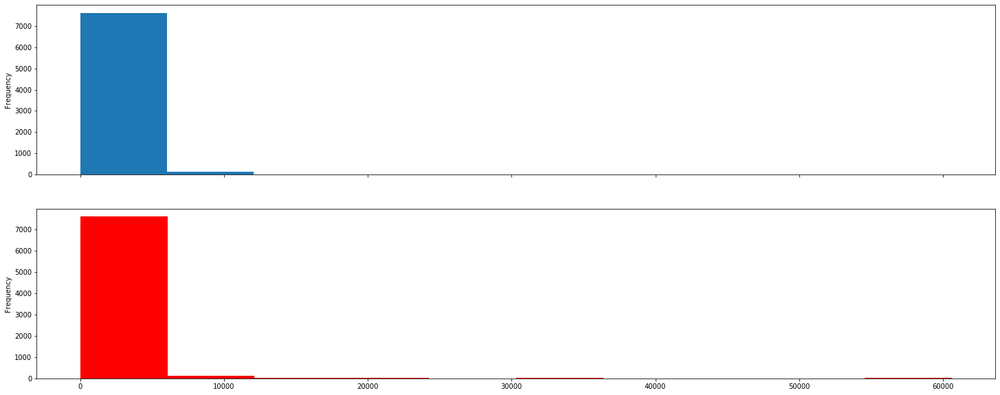

In [29]:
fig,axis=plt.subplots(2,1,sharex=True,figsize=(25,10))
crypto["price_hr_1"].plot.hist(ax=axis[0])
crypto["price_hr_24"].plot.hist(ax=axis[1],color="red")

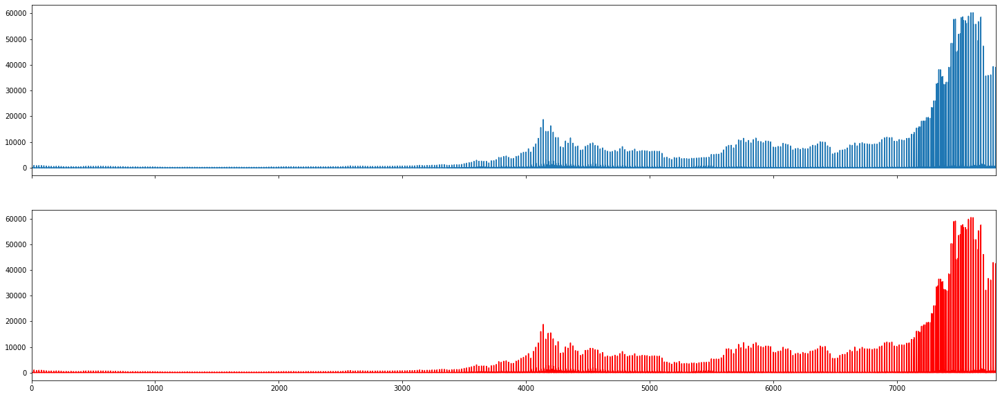

In [30]:
fig,axis=plt.subplots(2,1,sharex=True,figsize=(25,10))
crypto["price_hr_1"].plot.line(ax=axis[0])
crypto["price_hr_24"].plot.line(color="red")

#### 2. Categorical Analysis

In [5]:
px.bar(crypto,"Rank",color="Date")

In [16]:
f=px.pie(crypto,"Symbol")
f.show()

In [12]:
f=px.pie(crypto,"Rank")
f.show()

In [33]:
px.pie(crypto,"Date_Year").show()

# 5. Bivariate Analysis

## a. Numerical to Numerical

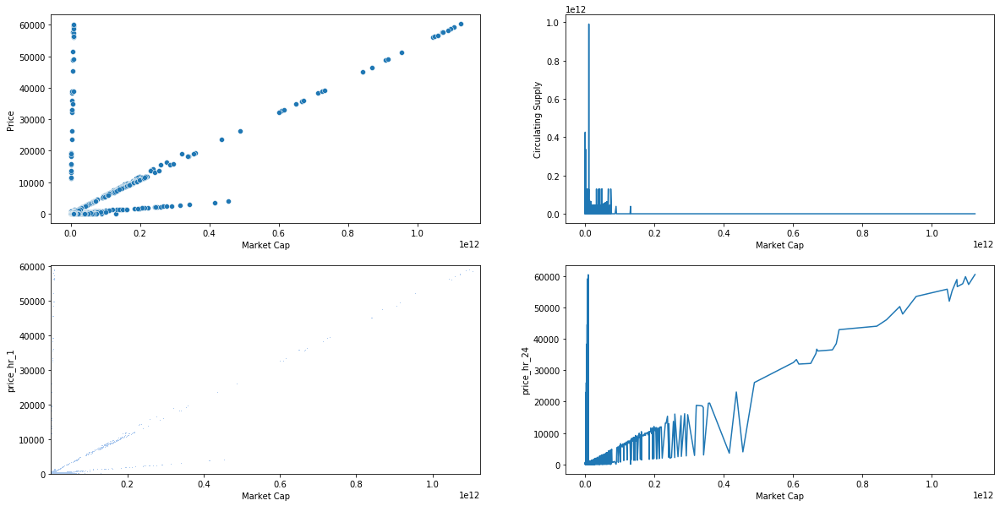

In [34]:
fig,axis=plt.subplots(2,2,figsize=(20,10))
sns.scatterplot(x="Market Cap",y="Price",data=crypto,ax=axis[0][0])
sns.lineplot(x="Market Cap",y="Circulating Supply",data=crypto,ax=axis[0][1])
sns.histplot(x="Market Cap",y="price_hr_1",data=crypto,ax=axis[1][0])
sns.lineplot(x="Market Cap",y="price_hr_24",data=crypto,ax=axis[1][1])

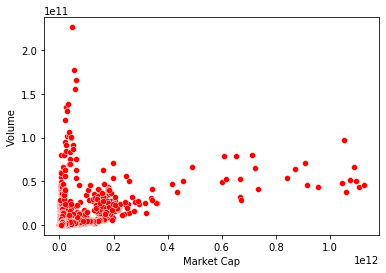

In [30]:
sns.scatterplot(x=crypto["Market Cap"],y=crypto["Volume"],color="red")

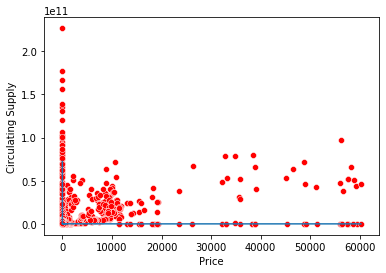

In [33]:
sns.lineplot(x=crypto["Price"],y=crypto["Circulating Supply"])
sns.scatterplot(x=crypto["Price"],y=crypto["Volume"],color="red")

[Text(0, 0.5, 'Price hr/24hr')]

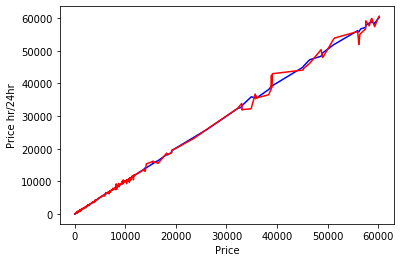

In [52]:
f=sns.lineplot(x="Price",y="price_hr_1",data=crypto,color="blue")
f=sns.lineplot(x="Price",y="price_hr_24",data=crypto,color="red")
f.set(ylabel="Price hr/24hr")

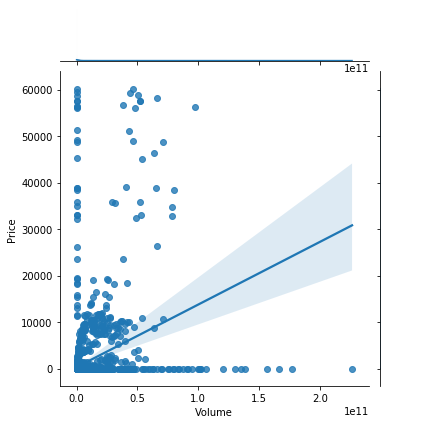

In [10]:
sns.jointplot(x=crypto["Volume"],y=crypto["Price"],kind="reg")

## b. Categorical to Numerical

In [16]:
px.scatter(crypto,"Market Cap",color="Date").show()

In [59]:
px.line(crypto,"Market Cap",color="Symbol").show()

In [20]:
px.funnel(crypto,"Market Cap",color="Date_Year").show()

In [13]:
px.scatter(crypto,"Market Cap",color="Rank").show()

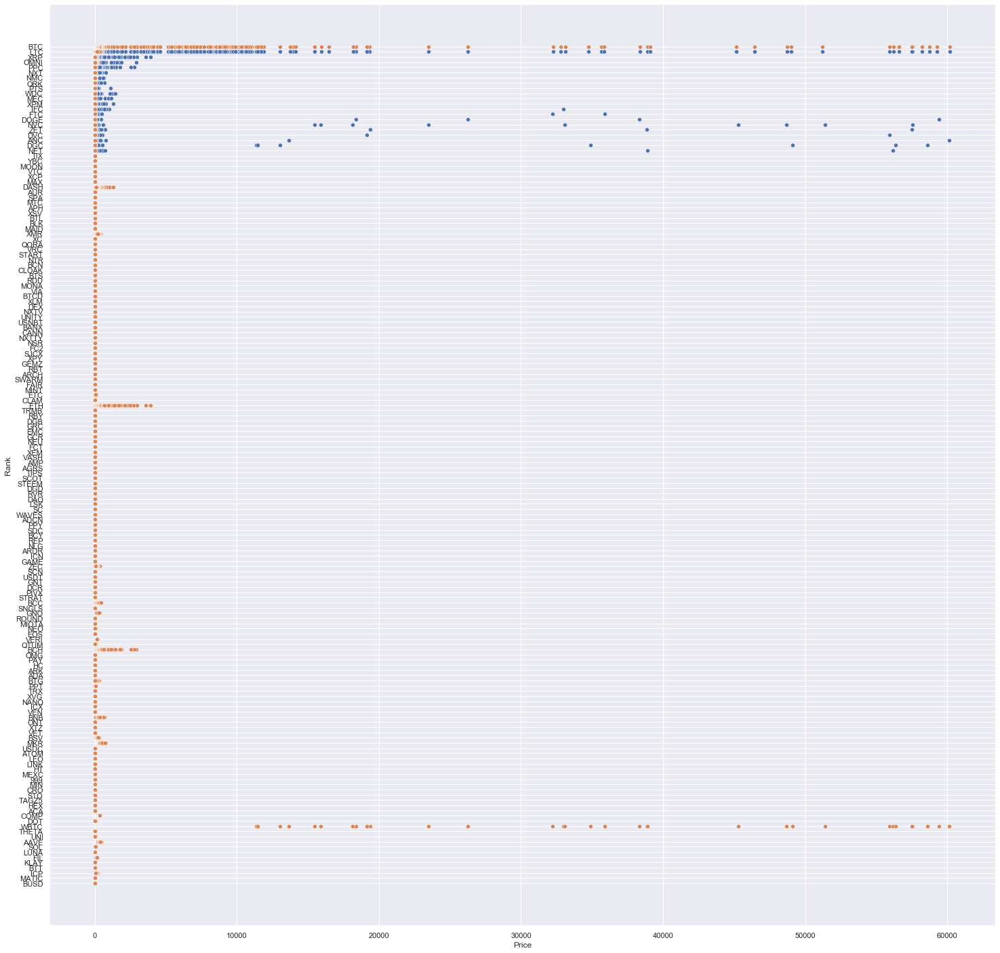

In [24]:
sns.set(rc={"figure.figsize":(25, 25)}) 
sns.scatterplot(x="Price",y="Rank",data=crypto)
sns.scatterplot(x="Price",y="Symbol",data=crypto)

In [26]:
px.line(crypto,"Price",color="Date").show()

In [27]:
px.funnel(crypto,"Price",color="Date_Year").show()

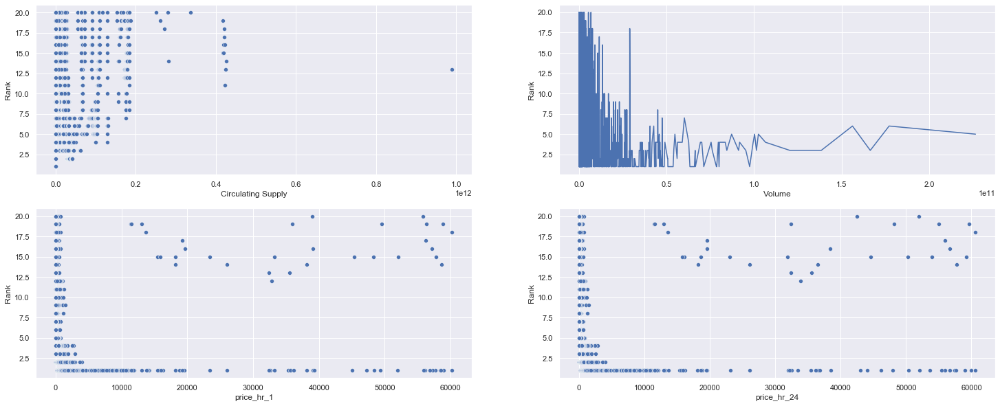

In [32]:
fig,axis=plt.subplots(2,2,figsize=(25,10))
sns.scatterplot(x="Circulating Supply",y="Rank",data=crypto,ax=axis[0][0])

sns.lineplot(x="Volume",y="Rank",data=crypto,ax=axis[0][1])

sns.scatterplot(x="price_hr_1",y="Rank",data=crypto,ax=axis[1][0])

sns.scatterplot(x="price_hr_24",y="Rank",data=crypto,ax=axis[1][1])

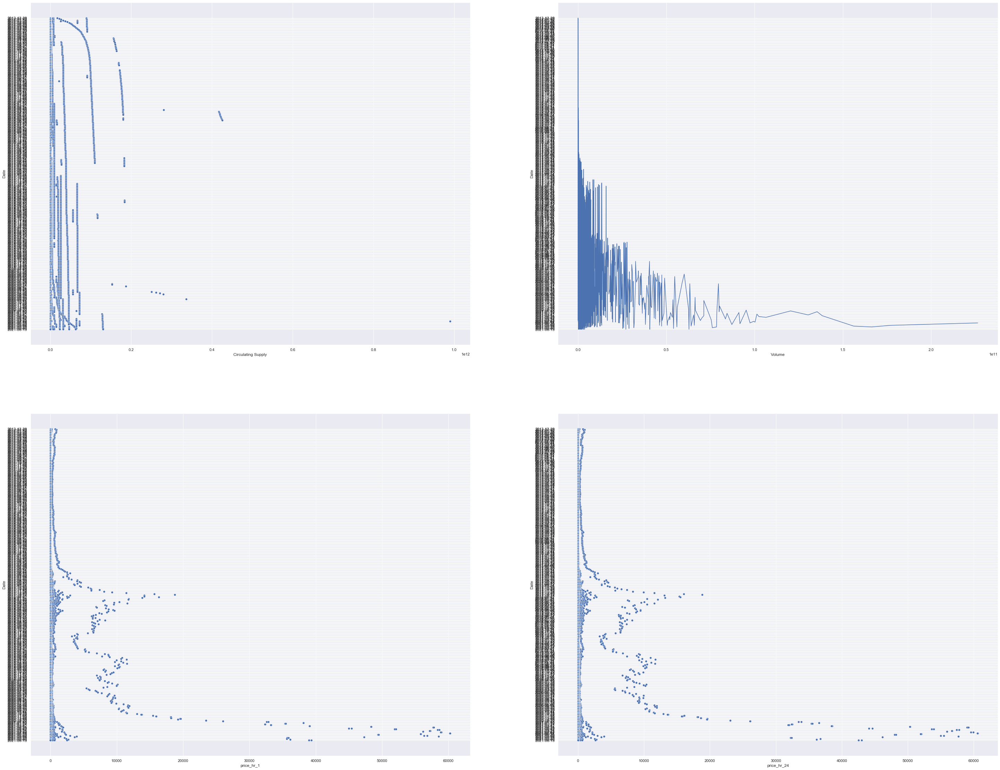

In [34]:
fig,axis=plt.subplots(2,2,figsize=(50,40))
sns.scatterplot(x="Circulating Supply",y="Date",data=crypto,ax=axis[0][0])

sns.lineplot(x="Volume",y="Date",data=crypto,ax=axis[0][1])

sns.scatterplot(x="price_hr_1",y="Date",data=crypto,ax=axis[1][0])

sns.scatterplot(x="price_hr_24",y="Date",data=crypto,ax=axis[1][1])

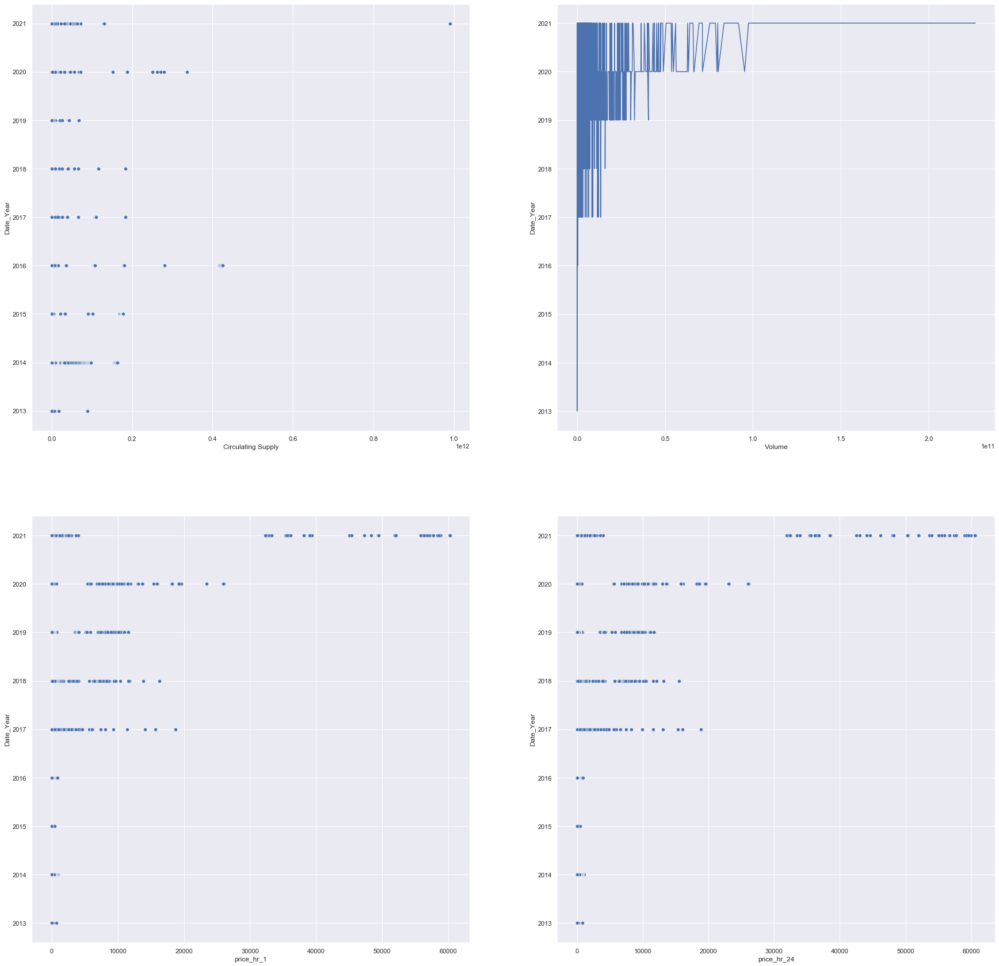

In [36]:
fig,axis=plt.subplots(2,2,figsize=(30,30))
sns.scatterplot(x="Circulating Supply",y="Date_Year",data=crypto,ax=axis[0][0])

sns.lineplot(x="Volume",y="Date_Year",data=crypto,ax=axis[0][1])

sns.scatterplot(x="price_hr_1",y="Date_Year",data=crypto,ax=axis[1][0])

sns.scatterplot(x="price_hr_24",y="Date_Year",data=crypto,ax=axis[1][1])

## c. Categorical to Categorical

In [ ]:
ctab=pd.crosstab(index=crypto.index,columns=[crypto["Rank"],crypto["Date_Year"]])
ctab.plot.bar(stacked=True)

# 6. Multivarient variate Analysis

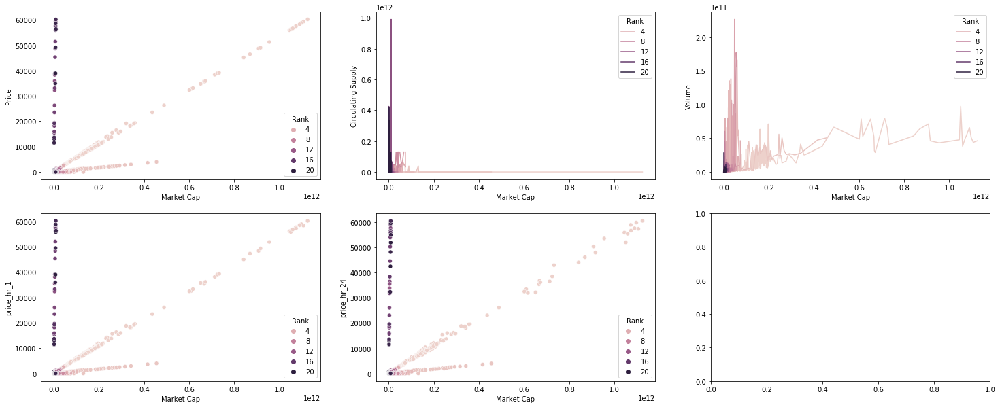

In [46]:
fig,axis=plt.subplots(2,3,figsize=(25,10))
sns.scatterplot(x="Market Cap",y="Price",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[0][0])
sns.lineplot(x="Market Cap",y="Circulating Supply",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[0][1])
sns.lineplot(x="Market Cap",y="Volume",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[0][2])
sns.scatterplot(x="Market Cap",y="price_hr_1",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[1][0])
sns.scatterplot(x="Market Cap",y="price_hr_24",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[1][1])

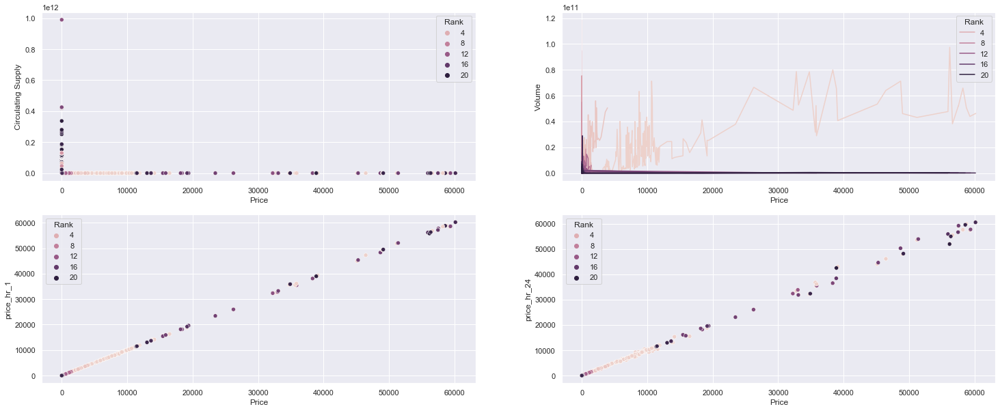

In [40]:
fig,axis=plt.subplots(2,2,figsize=(25,10))
sns.scatterplot(x="Price",y="Circulating Supply",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[0][0])
sns.lineplot(x="Price",y="Volume",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[0][1])
sns.scatterplot(x="Price",y="price_hr_1",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[1][0])
sns.scatterplot(x="Price",y="price_hr_24",hue=crypto["Rank"].astype(int),data=crypto,ax=axis[1][1])

In [45]:
px.line(crypto,"Market Cap","Date",color="Symbol")

In [48]:
px.scatter(crypto,"Market Cap","Price",color="Symbol")

In [67]:
px.line(crypto,"Price","Date",color="Symbol")

In [17]:
px.scatter(crypto,"Price","Date",color="Symbol")

In [58]:
px.box(crypto,"Price",color="Symbol")

In [39]:
px.line(crypto,x="Price",y="Circulating Supply",color="Symbol")

In [ ]:
sns.scatterplot("Circulating Supply","Volume",hue=crypto["Rank"].astype(int),data=crypto)

In [ ]:
sns.scatterplot("Circulating Supply","price_hr_1",hue=crypto["Rank"].astype(int),data=crypto)

In [ ]:
sns.scatterplot("Circulating Supply","price_hr_24",hue=crypto["Rank"].astype(int),data=crypto)

In [ ]:
sns.scatterplot("Volume","price_hr_1",hue=crypto["Rank"].astype(int),data=crypto)

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



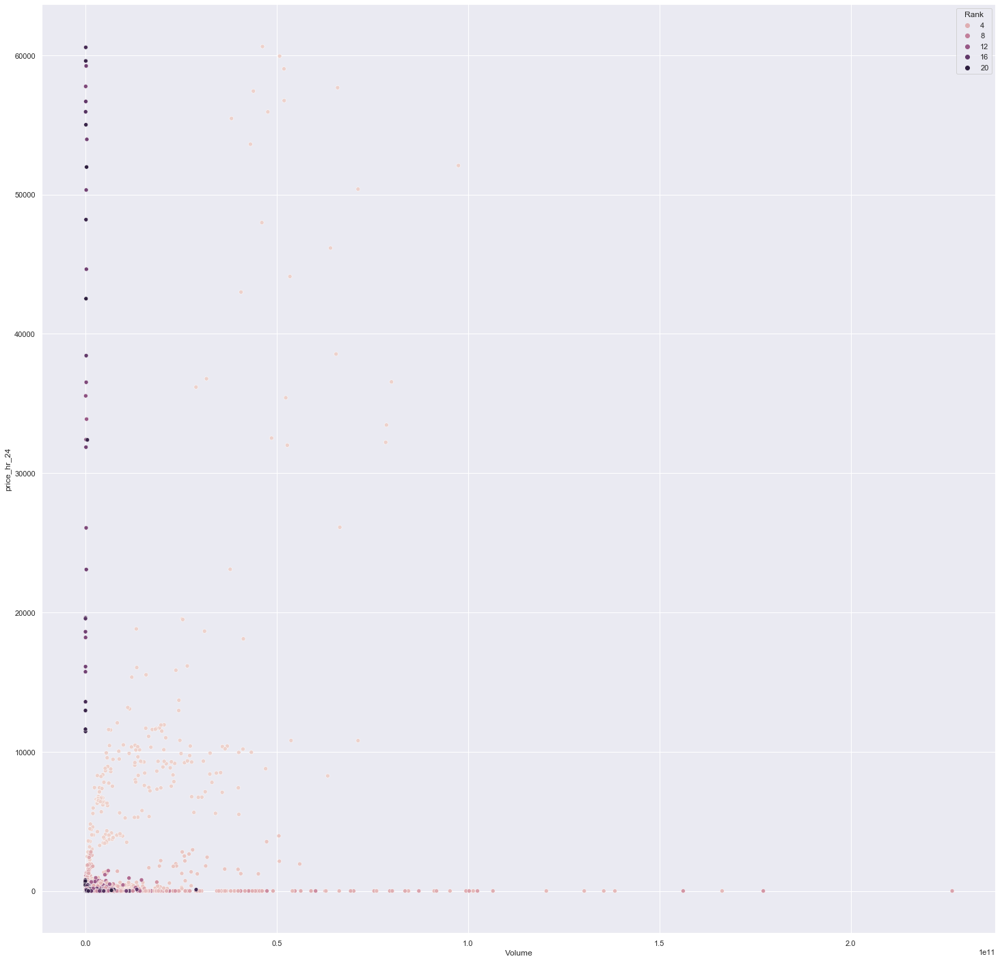

In [65]:
sns.scatterplot("Volume","price_hr_24",hue=crypto["Rank"].astype(int),data=crypto)

In [13]:
crypto_numeric=crypto[["Market Cap","Price","Circulating Supply",
                     "Volume","price_hr_1","price_hr_24"]]
crypto_numeric["Date_Year"]=crypto["Date_Year"].astype(int)
crypto_numeric["Rank"]=crypto["Rank"].astype(int)

C:\Users\Faiza\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Faiza\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



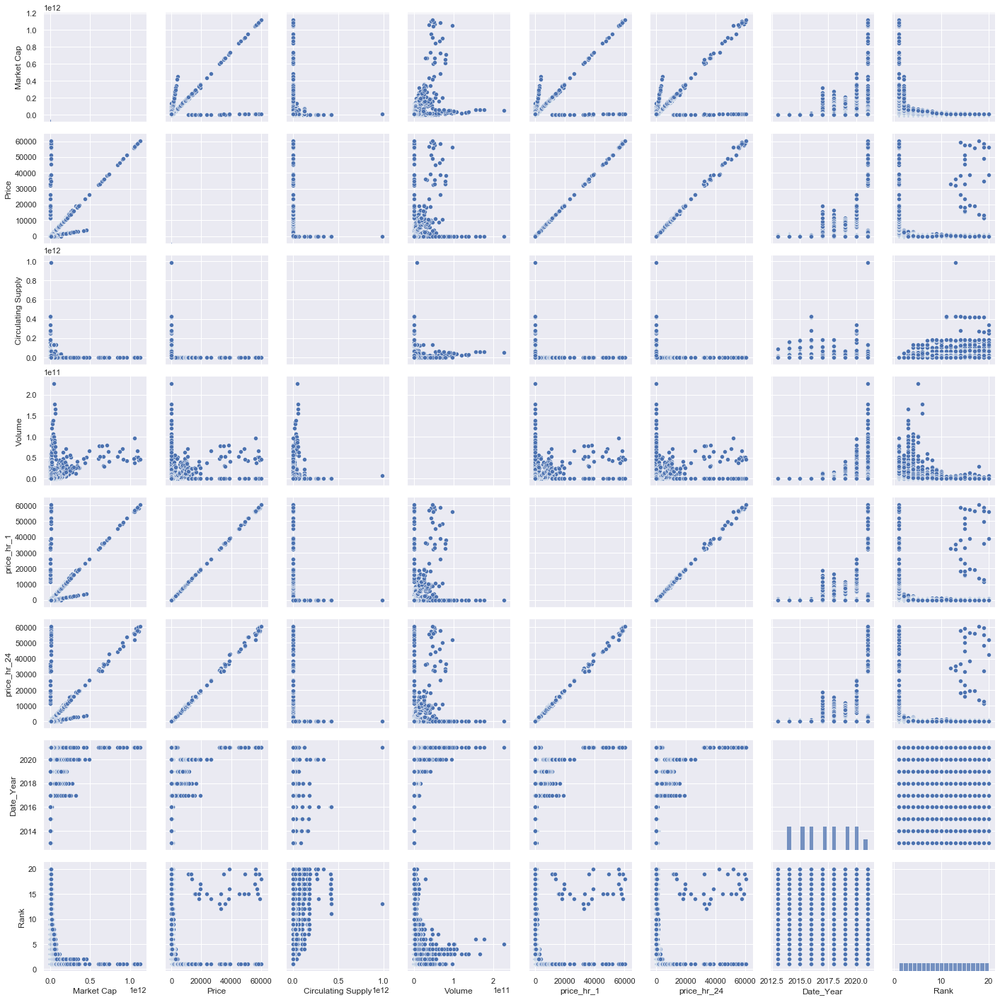

In [62]:
sns.pairplot(crypto_numeric)

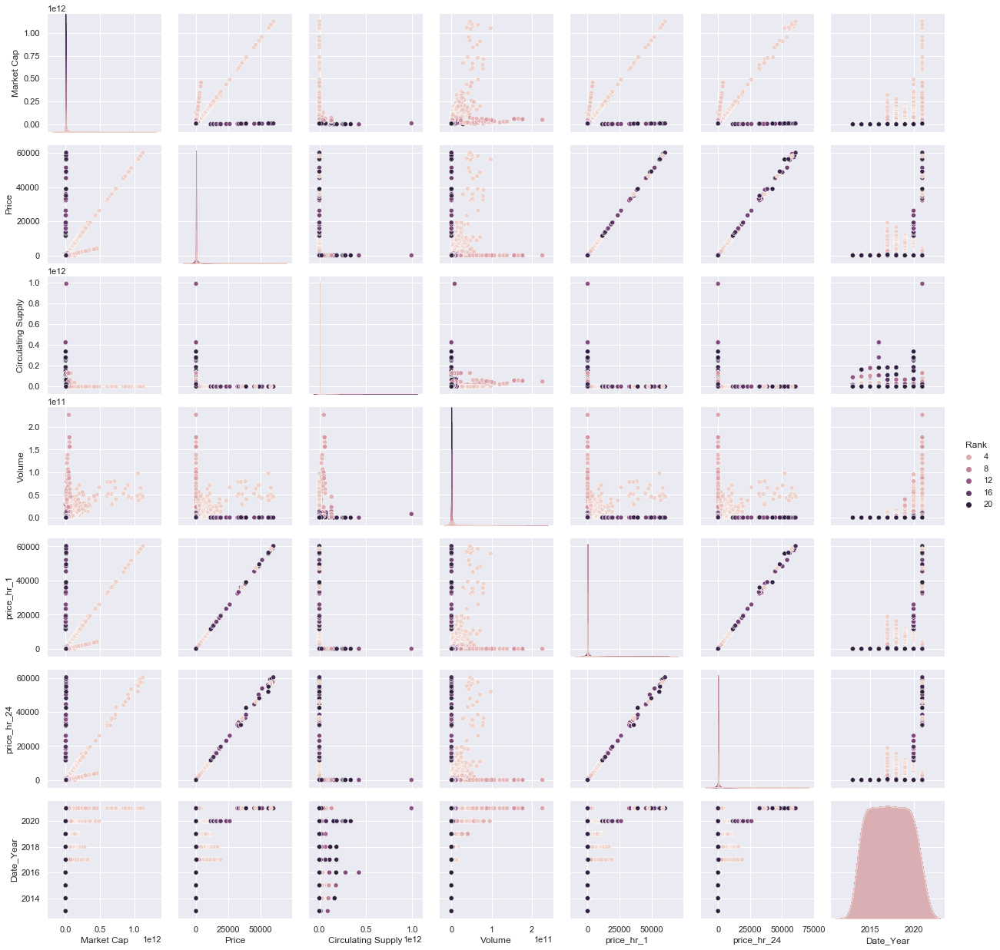

In [63]:
sns.pairplot(crypto_numeric,hue="Rank")

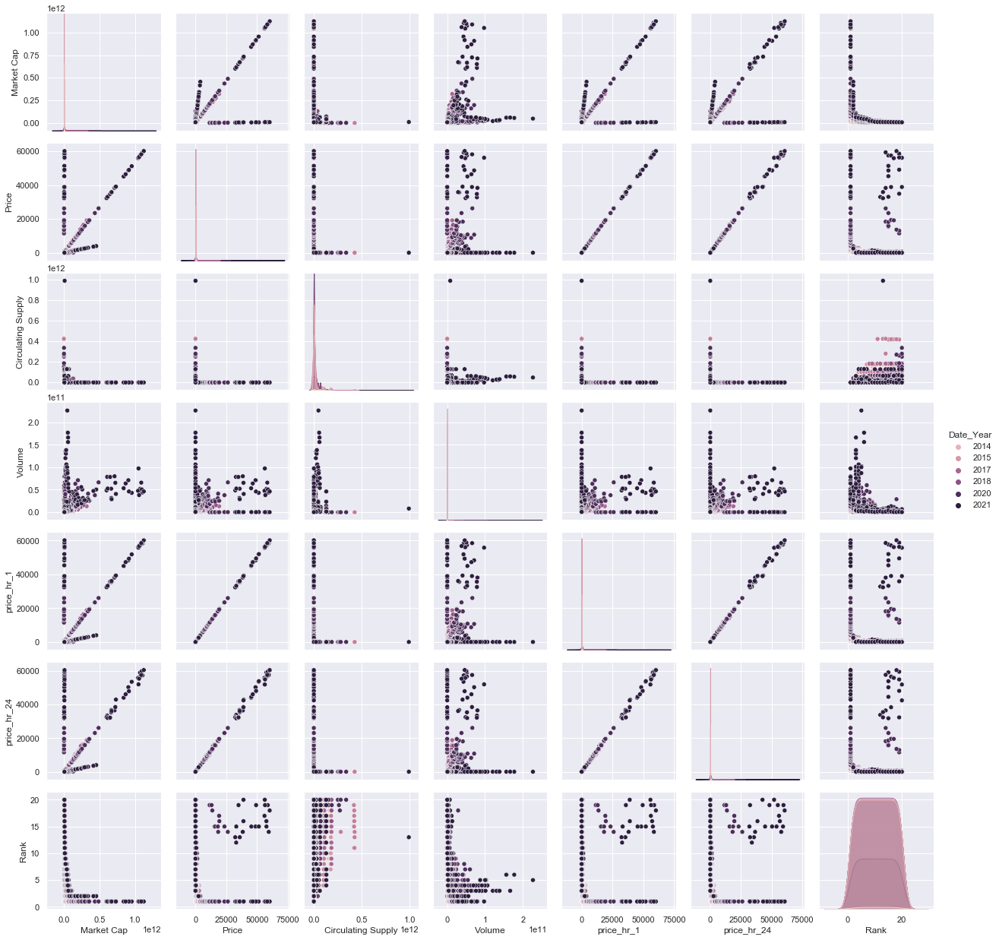

In [64]:
sns.pairplot(crypto_numeric,hue="Date_Year")

In [11]:
sns.set(rc={"figure.figsize":(5, 5)})

# 7. Correlation Analysis

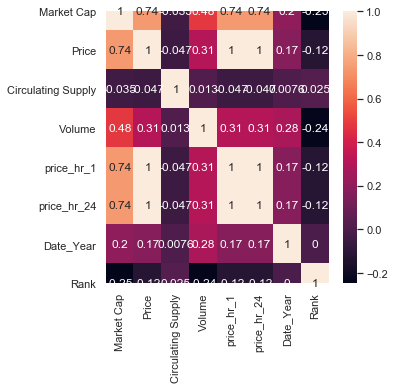

In [14]:
corr=crypto_numeric.corr()
sns.heatmap(corr,annot=True)

# BTC

In [6]:
btc=crypto[crypto["Symbol"].str.match("BTC")]

In [7]:
btc

,Date,Date_Year,Rank,Symbol,Market Cap,Price,Circulating Supply,Volume,%1h,price_hr_1,%24h,price_hr_24,%7d
0,2013-12-29,2013,1,BTC,9.082103e+09,745.05,12189925.0,1.901134e+07,-0.10,744.304950,1.96,759.652980,17.84
20,2014-01-05,2014,1,BTC,1.137966e+10,933.53,12189925.0,7.289852e+07,0.25,935.863825,8.36,1011.573108,25.84
40,2014-01-12,2014,1,BTC,1.057865e+10,863.22,12254875.0,3.962350e+07,-0.62,857.868036,-5.77,813.412206,-8.53
60,2014-01-19,2014,1,BTC,1.069950e+10,870.96,12284725.0,2.436567e+07,2.11,889.337256,3.78,903.882288,1.02
80,2014-01-26,2014,1,BTC,1.090280e+10,885.28,12315650.0,3.222425e+07,0.41,888.909648,3.84,919.274752,2.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7700,2021-05-16,2021,1,BTC,8.692791e+11,46456.06,18711856.0,6.404787e+10,1.77,47278.332262,-0.65,46154.095610,-20.22
7720,2021-05-23,2021,1,BTC,6.506863e+11,34770.58,18713700.0,7.846927e+10,2.66,35695.477428,-7.37,32207.988254,-25.15
7740,2021-05-30,2021,1,BTC,6.679766e+11,35678.13,18722300.0,3.164608e+10,-0.18,35613.909366,3.07,36773.448591,2.61
7760,2021-06-06,2021,1,BTC,6.716526e+11,35862.38,18728612.0,2.891344e+10,0.74,36127.761612,0.87,36174.382706,0.52


In [73]:
px.line(btc,btc["Date"],btc["Price"])

In [23]:
px.scatter(btc,btc["Date"],btc["Price"],color="Date_Year")

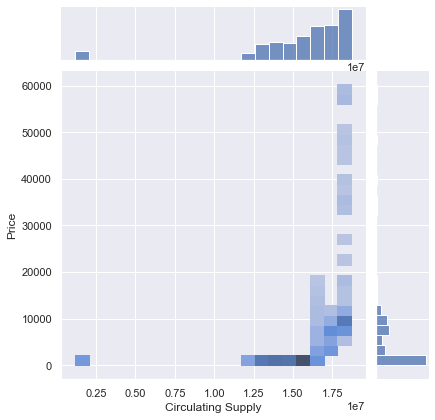

In [41]:
sns.jointplot(x=btc["Circulating Supply"],y=btc["Price"],kind="hist")

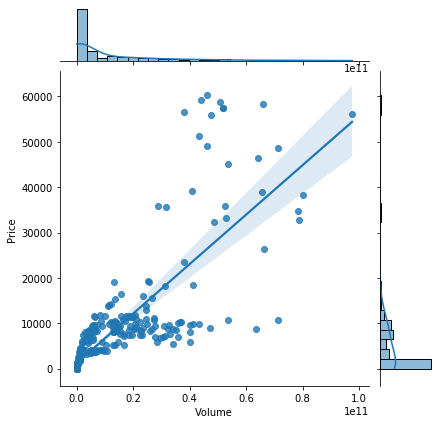

In [9]:
sns.jointplot(x=btc["Volume"],y=btc["Price"],kind="reg")

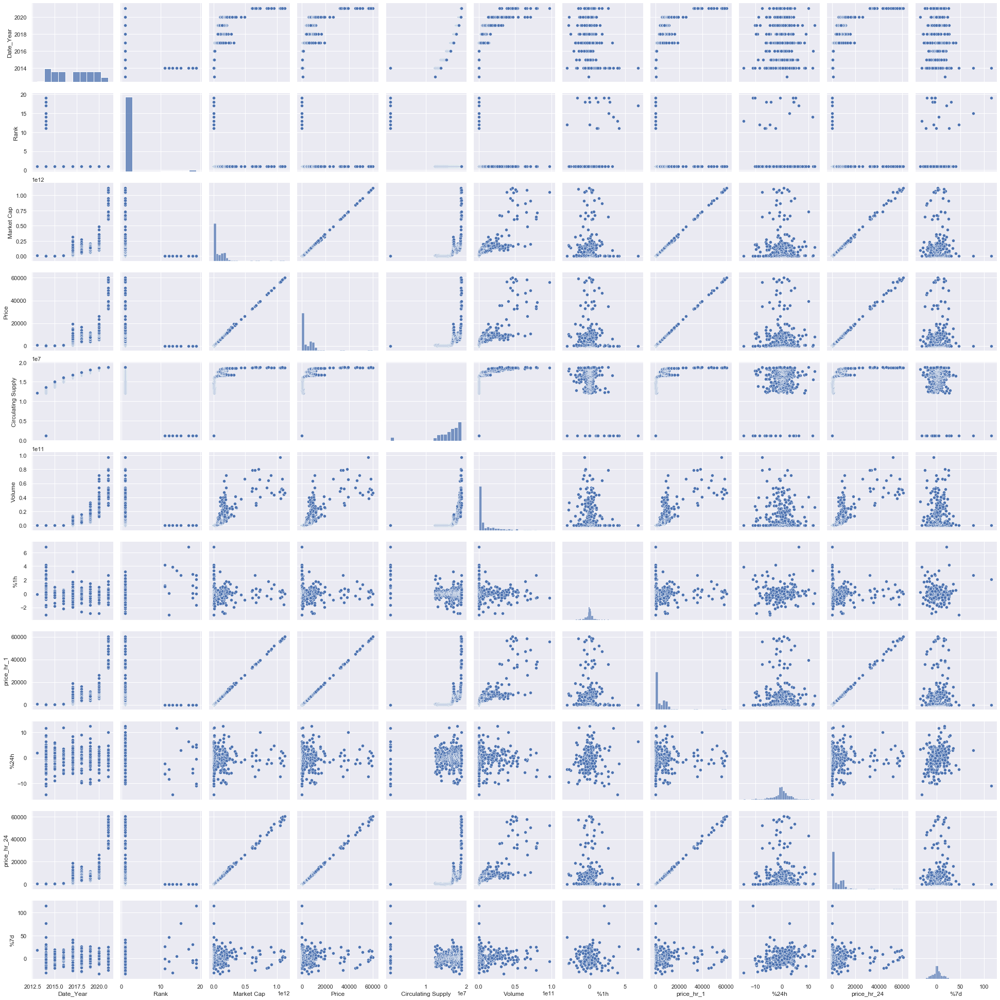

In [74]:
sns.pairplot(btc)

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\li

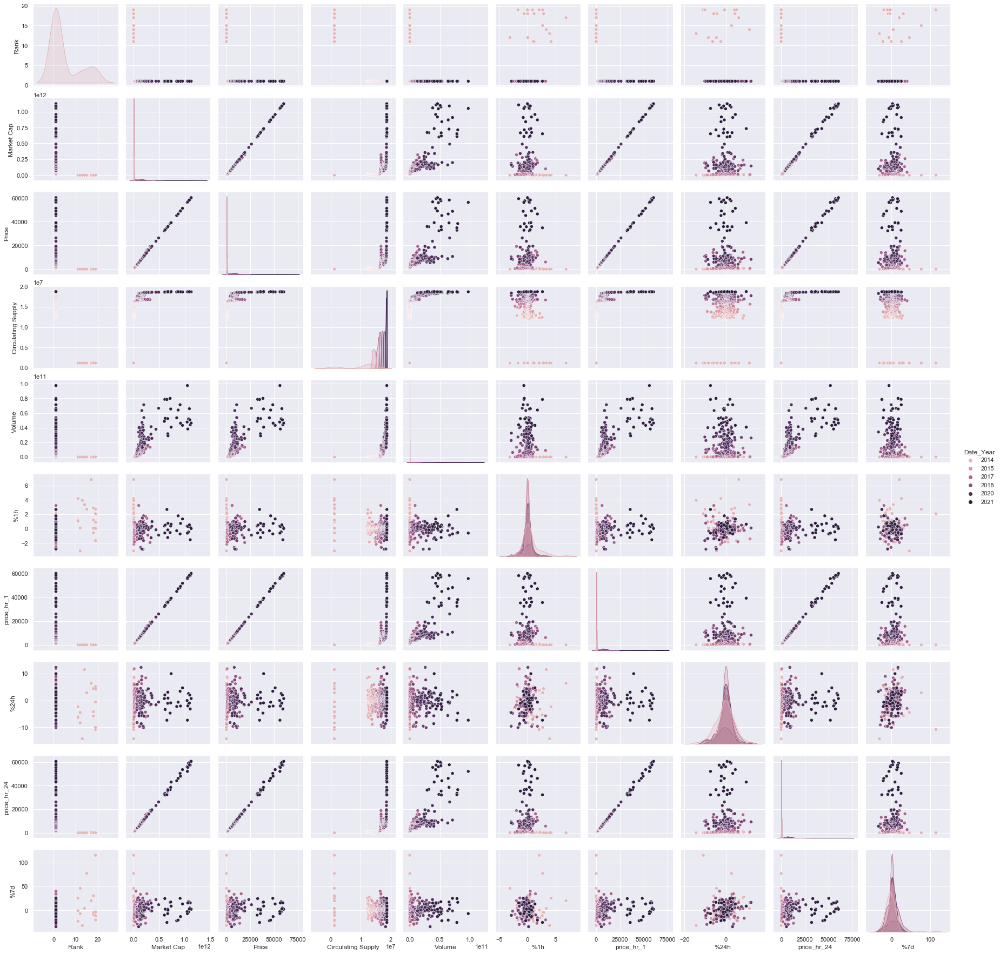

In [75]:
sns.pairplot(btc,hue="Date_Year")

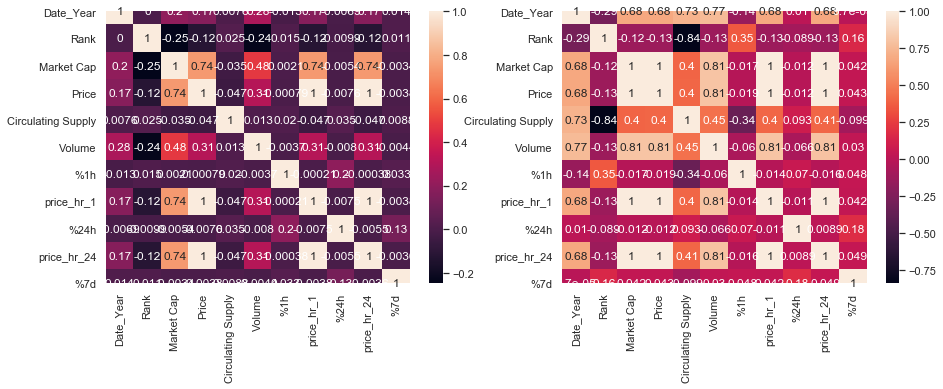

In [76]:
btc_corr=btc.corr()
fig, axes = plt.subplots(1, 2, sharex=True, figsize=(15,5))
sns.heatmap(crypto.corr(),ax=axes[0],annot=True)
sns.heatmap(btc_corr,ax=axes[1],annot=True)

In [77]:
px.box(btc,"Price")

In [78]:
px.box(btc,"Market Cap")

# LTC 

In [79]:
ltc=crypto[crypto["Symbol"].str.match("LTC")]

In [80]:
ltc

,Date,Date_Year,Rank,Symbol,Market Cap,Price,Circulating Supply,Volume,%1h,price_hr_1,%24h,price_hr_24,%7d
1,2013-12-29,2013,2,LTC,5.868998e+08,24.07,24387992.0,1.138424e+07,-0.94,23.843742,6.35,25.598445,39.97
21,2014-01-05,2014,2,LTC,6.599006e+08,26.83,24595942.0,2.999503e+07,-0.21,26.773657,6.49,28.571267,11.95
41,2014-01-12,2014,2,LTC,6.226452e+08,25.09,24812704.0,2.043352e+07,-0.63,24.931933,-6.65,23.421515,-7.02
61,2014-01-19,2014,2,LTC,6.364117e+08,25.44,25015454.0,6.974646e+06,2.10,25.974240,3.89,26.429616,1.00
81,2014-01-26,2014,2,LTC,6.072356e+08,24.12,25171554.0,1.219916e+07,0.37,24.209244,4.26,25.147512,-3.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7711,2021-05-16,2021,12,LTC,1.980057e+10,296.63,66752415.0,5.522282e+09,1.63,301.465069,-1.05,293.515385,-23.24
7732,2021-05-23,2021,13,LTC,9.580264e+09,143.52,66752415.0,6.847843e+09,1.67,145.916784,-15.38,121.446624,-51.62
7754,2021-05-30,2021,15,LTC,1.141321e+10,170.98,66752415.0,3.015850e+09,-0.53,170.073806,4.38,178.468924,19.13
7773,2021-06-06,2021,14,LTC,1.179111e+10,176.64,66752415.0,2.250385e+09,1.07,178.530048,2.09,180.331776,3.31


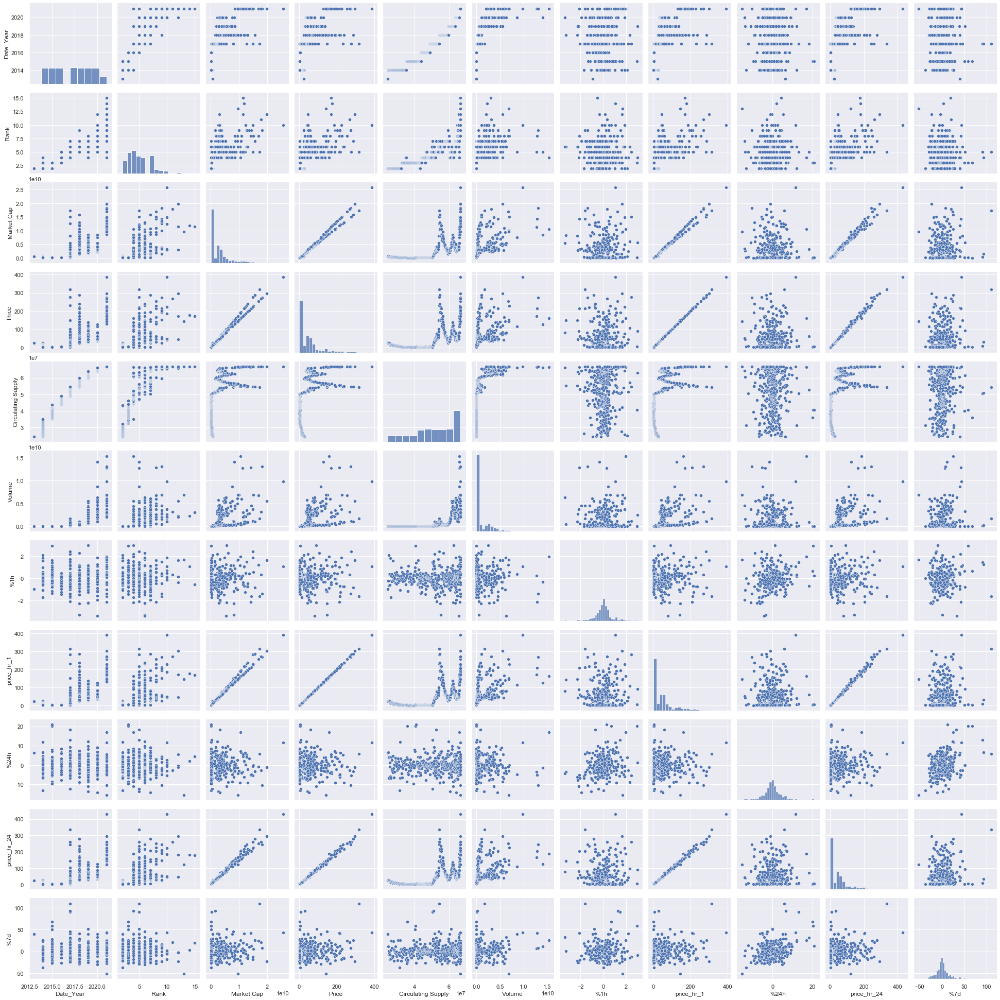

In [81]:
sns.pairplot(ltc)

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning:

Dataset has 0 variance; skipping density estimate.

C:\Users\Faiza\Anaconda3\li

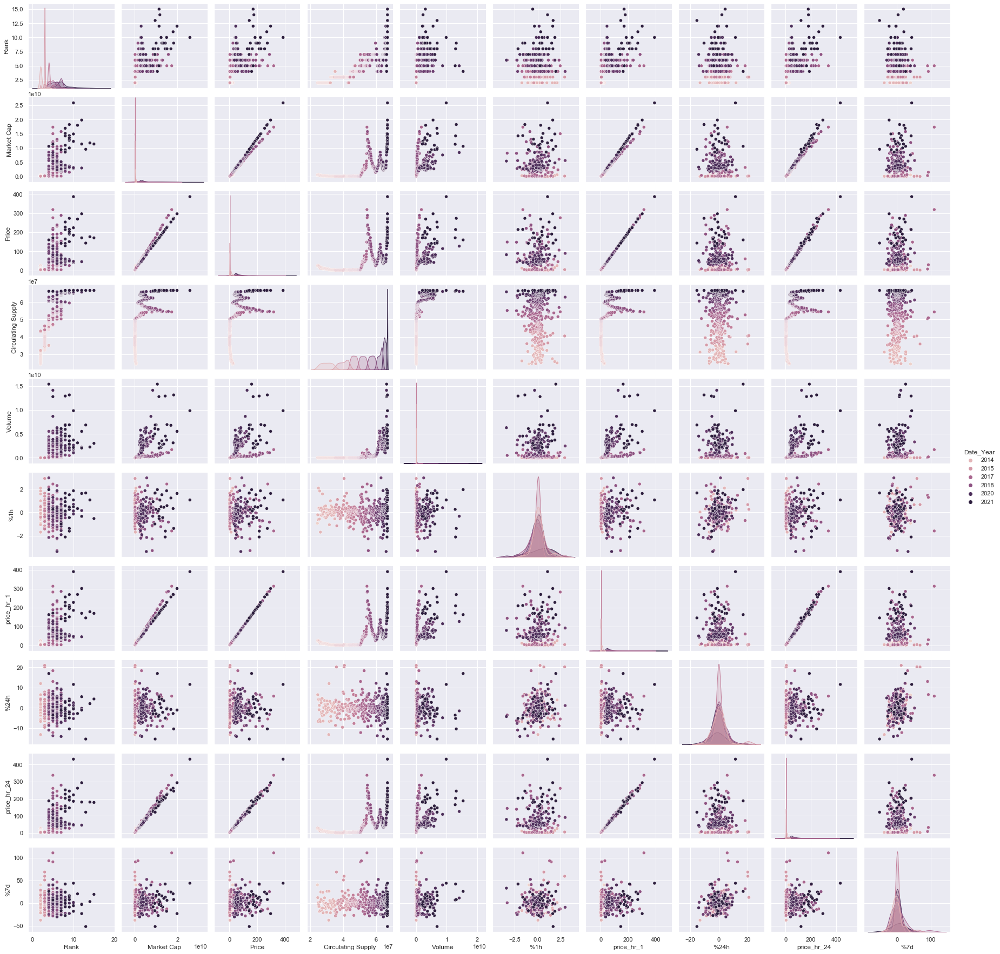

In [82]:
sns.pairplot(ltc,hue="Date_Year")

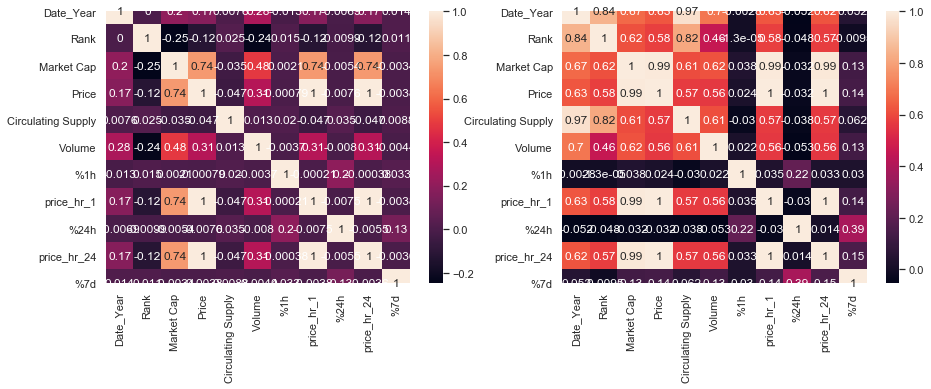

In [83]:
ltc_corr=ltc.corr()
fig, axes = plt.subplots(1, 2, sharex=True, figsize=(15,5))
sns.heatmap(crypto.corr(),ax=axes[0],annot=True)
sns.heatmap(ltc_corr,ax=axes[1],annot=True)

In [84]:
px.box(ltc,"Price")

In [85]:
px.box(ltc,"Market Cap")

# Over all, BTC, LTC -CORR

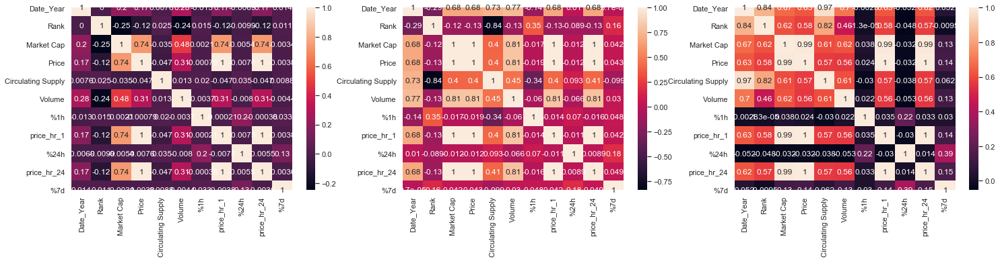

In [86]:
btc_corr=btc.corr()
ltc_corr=ltc.corr()
fig, axes = plt.subplots(1, 3, sharex=True, figsize=(25,5))
sns.heatmap(crypto.corr(),ax=axes[0],annot=True)
sns.heatmap(btc_corr,ax=axes[1],annot=True)
sns.heatmap(ltc_corr,ax=axes[2],annot=True)